# Wines Review - Data exploration and transformation

See a comperhansive overview and details on this dataset [in the kaggle page](https://www.kaggle.com/zynicide/wine-reviews?select=winemag-data-130k-v2.csv).


In the data exploration stage, we want to get familiar with the data we are working on, in terms of:

* Shape of the dataset - how big is it (how many rows), how many columns, how is it constructed what each row represent, etc.
* Columns data types, missing values, distributions, unique values etc.
* Correlations, dependencies, inconsistencies (e.g. "Yes" vs "yes") etc.

Based on the above (and more) we might choose to:

* Reshape the data 
* Remove duplications/invalid entries/outliers
* Transform part of the data
* Normalize values to a stanrd from (i.e. set all strings fields to lower case form)
* Etc.

The goal of this stage is to gain understanding of what is the data infont of us and prepare it for our modeling stage.

In [33]:
import pandas as pd
import cufflinks as cf; cf.go_offline()

## Data loading 

In [73]:
wine_reviews = pd.read_csv("data/winemag-data-130k-v2.csv")
wine_reviews.shape

(129971, 14)

In [74]:
wine_reviews.sample(5)

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery
108108,108108,France,From a 24-acre vineyard with vines aged from f...,NaN,86,16.0,Loire Valley,Quincy,NaN,Roger Voss,@vossroger,Domaine Siret-Courtaud 2014 Quincy,Sauvignon Blanc,Domaine Siret-Courtaud
65600,65600,US,From high-elevation blocks once devoted to Cab...,Estate,92,35.0,California,Alexander Valley,Sonoma,Virginie Boone,@vboone,Stonestreet 2014 Estate Sauvignon Blanc (Alexa...,Sauvignon Blanc,Stonestreet
23663,23663,France,"This is a ripe, full-bodied wine, packed with ...",NaN,89,NaN,Provence,Bandol,NaN,Roger Voss,@vossroger,Domaine de Frégate 2009 Red (Bandol),Rhône-style Red Blend,Domaine de Frégate
53228,53228,US,"Flavors of green hay, tart juniper berry and g...",NaN,88,25.0,California,Rutherford,Napa,NaN,NaN,1070 Green 2011 Sauvignon Blanc (Rutherford),Sauvignon Blanc,1070 Green
31526,31526,US,"Dry and withered, with green, minty tartness. ...",NaN,84,35.0,California,Carmel Valley,Central Coast,NaN,NaN,Joullian 2006 Cabernet Franc (Carmel Valley),Cabernet Franc,Joullian


Let's remove the "Unnamed" column:

In [75]:
wine_reviews = wine_reviews.drop(columns=['Unnamed: 0'])
wine_reviews.shape

(129971, 13)

## Exploration

Here we will try to better understand the data, it's content, missing values, interesting correlations etc.

In [6]:
wine_reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129971 entries, 0 to 129970
Data columns (total 14 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Unnamed: 0             129971 non-null  int64  
 1   country                129908 non-null  object 
 2   description            129971 non-null  object 
 3   designation            92506 non-null   object 
 4   points                 129971 non-null  int64  
 5   price                  120975 non-null  float64
 6   province               129908 non-null  object 
 7   region_1               108724 non-null  object 
 8   region_2               50511 non-null   object 
 9   taster_name            103727 non-null  object 
 10  taster_twitter_handle  98758 non-null   object 
 11  title                  129971 non-null  object 
 12  variety                129970 non-null  object 
 13  winery                 129971 non-null  object 
dtypes: float64(1), int64(2), object(11)


We see that some columns contain nulls.

## Title 

It seems each row corresponds to a specific wine bottle i.e. each row is a unique bottle. We can verify that by first:
* Seeing that "title" does not contain missing values
* Using the nunique()/value_counts().max() function to verify our assumption

In [42]:
wine_reviews.title.nunique()

118840

We see that the numbers of unique titles (118840) is smaller than the number of rows. Which means our assumption above was wrong. Let's look at rows having the same title:

In [44]:
wine_reviews.title.value_counts().head()

Gloria Ferrer NV Sonoma Brut Sparkling (Sonoma County)     11
Korbel NV Brut Sparkling (California)                       9
Segura Viudas NV Extra Dry Sparkling (Cava)                 8
Segura Viudas NV Aria Estate Extra Dry Sparkling (Cava)     7
Gloria Ferrer NV Blanc de Noirs Sparkling (Carneros)        7
Name: title, dtype: int64

In [43]:
wine_reviews[wine_reviews.title == wine_reviews.title.value_counts().idxmax()]

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery
3209,3209,US,"Creamy, lush and somewhat robust, this dry spa...",Sonoma Brut,90,22.0,California,Sonoma County,Sonoma,Virginie Boone,@vboone,Gloria Ferrer NV Sonoma Brut Sparkling (Sonoma...,Sparkling Blend,Gloria Ferrer
4399,4399,US,"Made predominantly from Pinot Noir, this is an...",Sonoma Brut,88,22.0,California,Sonoma County,Sonoma,Virginie Boone,@vboone,Gloria Ferrer NV Sonoma Brut Sparkling (Sonoma...,Sparkling Blend,Gloria Ferrer
27773,27773,US,A wonderfully drinkable sparkling wine that ap...,Sonoma Brut,90,20.0,California,Sonoma County,Sonoma,NaN,NaN,Gloria Ferrer NV Sonoma Brut Sparkling (Sonoma...,Sparkling Blend,Gloria Ferrer
63179,63179,US,"Made from mostly Pinot Noir grapes, with an ad...",Sonoma Brut,92,22.0,California,Sonoma County,Sonoma,Virginie Boone,@vboone,Gloria Ferrer NV Sonoma Brut Sparkling (Sonoma...,Sparkling Blend,Gloria Ferrer
65584,65584,US,"Made from mostly Pinot Noir grapes, with an ad...",Sonoma Brut,92,22.0,California,Sonoma County,Sonoma,Virginie Boone,@vboone,Gloria Ferrer NV Sonoma Brut Sparkling (Sonoma...,Sparkling Blend,Gloria Ferrer
81563,81563,US,This wine shows lots of finesse for the price....,Sonoma Brut,89,24.0,California,Sonoma County,Sonoma,NaN,NaN,Gloria Ferrer NV Sonoma Brut Sparkling (Sonoma...,Sparkling Blend,Gloria Ferrer
90689,90689,US,"Creamy, lush and somewhat robust, this dry spa...",Sonoma Brut,90,22.0,California,Sonoma County,Sonoma,Virginie Boone,@vboone,Gloria Ferrer NV Sonoma Brut Sparkling (Sonoma...,Sparkling Blend,Gloria Ferrer
94321,94321,US,"A bit rough and scouring in texture, this tast...",Sonoma Brut,85,20.0,California,Sonoma County,Sonoma,NaN,NaN,Gloria Ferrer NV Sonoma Brut Sparkling (Sonoma...,Sparkling Blend,Gloria Ferrer
100738,100738,US,"A good, dry and elegant bubbly. Shows crisp fl...",Sonoma Brut,89,20.0,California,Sonoma County,Sonoma,NaN,NaN,Gloria Ferrer NV Sonoma Brut Sparkling (Sonoma...,Sparkling Blend,Gloria Ferrer
109001,109001,US,From almost 92% Pinot Noir with the remainder ...,Sonoma Brut,88,22.0,California,Sonoma County,Sonoma,Virginie Boone,@vboone,Gloria Ferrer NV Sonoma Brut Sparkling (Sonoma...,Sparkling Blend,Gloria Ferrer


So we see a problem in the data:
* We have more than one review per title. This byitself might be ok
* By the description column, it seems most of the cases are different reviews (but by the same reviewer or unknown reviewer)
* Some of the reviews are still look duplicated

Depeniding on the ML problem we want to solve, and the magnitude of the problem, we might or might not fix those issues.

### Points

let's start looking at the points column. From the above we see it has no missing values. Some initial insights regarding the points distribution:

In [45]:
wine_reviews.points.describe()

count    129971.000000
mean         88.447138
std           3.039730
min          80.000000
25%          86.000000
50%          88.000000
75%          91.000000
max         100.000000
Name: points, dtype: float64

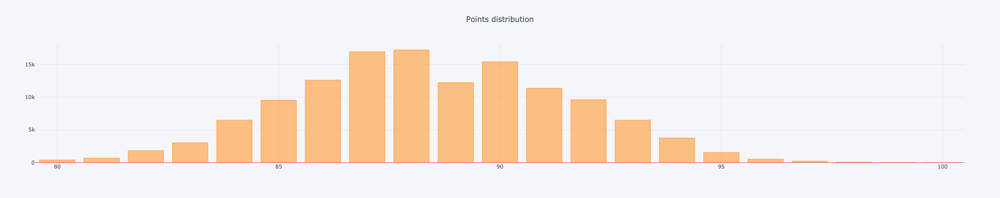

In [50]:
wine_reviews.points.value_counts().iplot(kind='bar', title = 'Points distribution', hline=(0))

### Country

In [17]:
wine_reviews.country.value_counts().head()

US          54504
France      22093
Italy       19540
Spain        6645
Portugal     5691
Name: country, dtype: int64

In [18]:
wine_reviews.country.value_counts().div(wine_reviews.shape[0]).head()

US          0.419355
France      0.169984
Italy       0.150341
Spain       0.051127
Portugal    0.043787
Name: country, dtype: float64

In [23]:
pd.concat([wine_reviews.country.value_counts().rename('counts'), 
          wine_reviews.country.value_counts().rename('proportion').div(wine_reviews.shape[0])], axis=1).head()

,counts,proportion
US,54504,0.419355
France,22093,0.169984
Italy,19540,0.150341
Spain,6645,0.051127
Portugal,5691,0.043787


What is the average score and price per country?

In [27]:
def calc_average_score_and_price(country_df):
    return pd.Series({'average_price': country_df.price.mean(),
                      'average_score': country_df.points.mean()})

In [29]:
stats_by_country = wine_reviews.groupby('country').apply(calc_average_score_and_price)
stats_by_country.head()

,average_price,average_score
country,,
Argentina,24.510117,86.710263
Armenia,14.500000,87.500000
Australia,35.437663,88.580507
Austria,30.762772,90.101345
Bosnia and Herzegovina,12.500000,86.500000


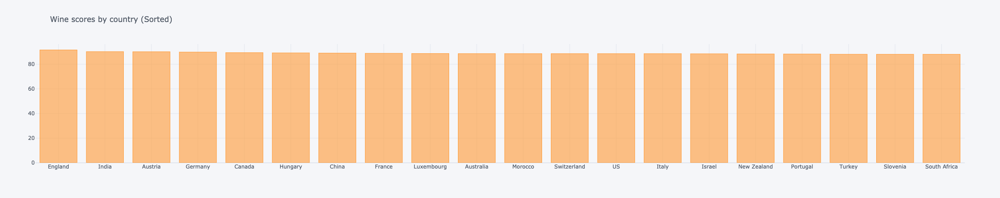

In [39]:
stats_by_country.average_score.sort_values(ascending=False).head(20).iplot(kind='bar', title = 'Wine scores by country (Sorted)')

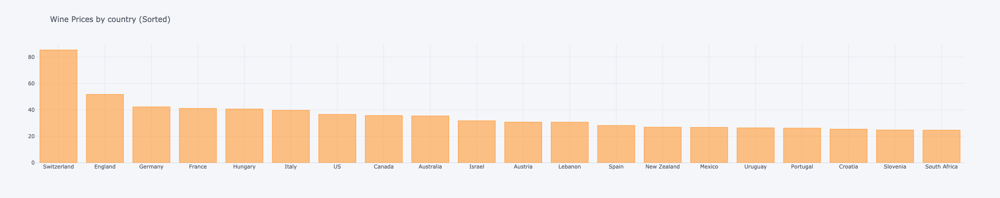

In [40]:
stats_by_country.average_price.sort_values(ascending=False).head(20).iplot(kind='bar', title = 'Wine Prices by country (Sorted)')

### Correlation between price and points

In [56]:
import plotly_express as px

In [70]:
# Use pd.DataFrame.corr? to see the documentation for pandas correlation function

In [55]:
wine_reviews[['price','points']].corr(method = 'pearson')

,price,points
price,1.000000,0.416167
points,0.416167,1.000000


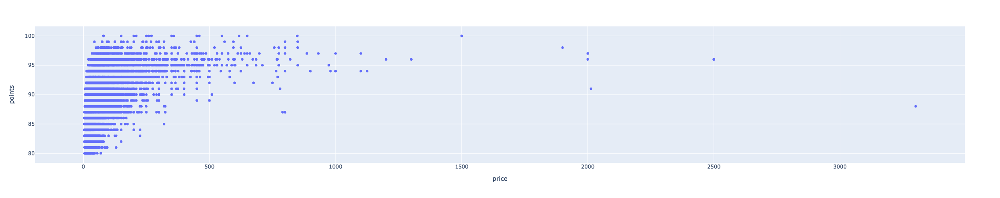

In [58]:
px.scatter(wine_reviews, x='price',y='points')

But prices are very strongly depending on country, while points (at least in theory - this assumption should be tested) are not. So:

In [64]:
top_ten_countries = wine_reviews.country.value_counts().index[:10]
list(top_ten_countries)

['US',
 'France',
 'Italy',
 'Spain',
 'Portugal',
 'Chile',
 'Argentina',
 'Austria',
 'Australia',
 'Germany']

In [65]:
wine_reviews.groupby('country')[['price','points']].corr(method = 'pearson').loc[top_ten_countries]

price    points
country                             
Argentina price   1.000000  0.568168
          points  0.568168  1.000000
Australia price   1.000000  0.466198
          points  0.466198  1.000000
Austria   price   1.000000  0.392841
          points  0.392841  1.000000
Chile     price   1.000000  0.480307
          points  0.480307  1.000000
France    price   1.000000  0.405829
          points  0.405829  1.000000
Germany   price   1.000000  0.453121
          points  0.453121  1.000000
Italy     price   1.000000  0.528073
          points  0.528073  1.000000
Portugal  price   1.000000  0.440235
          points  0.440235  1.000000
Spain     price   1.000000  0.471112
          points  0.471112  1.000000
US        price   1.000000  0.453079
          points  0.453079  1.000000

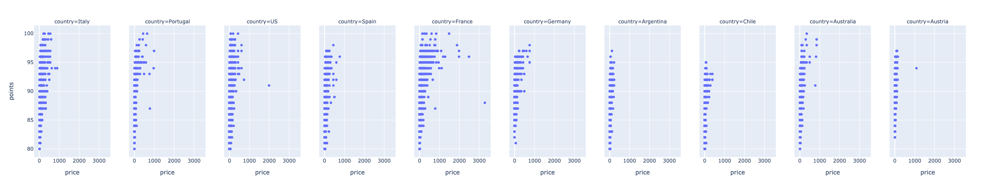

In [69]:
px.scatter(wine_reviews[wine_reviews.country.isin(top_ten_countries)], x='price',y='points',facet_col='country')